# Exploration

Import packages

In [1]:
import sys
sys.path.append("/Users/amishpopli/Desktop/projects portfolio/clustering geo location data/clustering-env/lib/python3.8/site-packages")

import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import pandas as pd
import numpy as np

from tqdm import tqdm

from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.neighbors import KNeighborsClassifier

from ipywidgets import interactive

from collections import defaultdict

import hdbscan
import folium
import re


cols = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
        '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
        '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
        '#000075', '#808080']*10

# Data exploration & cleaning

In [2]:
df = pd.read_csv("../data/taxi_data.csv")

In [3]:
df.duplicated(subset=["LAT","LON"]).values.any()

True

In [4]:
df.isna().values.any()

True

In [5]:
print(df.shape)
#### Drop na and duplicates
df.dropna(inplace = True)
df.drop_duplicates(subset=["LAT","LON"], inplace=True, keep="first")
print(df.shape)

(838, 3)
(823, 3)


In [6]:
x = np.array(df[["LAT","LON"]], dtype = "float64")

# Plotting data points 

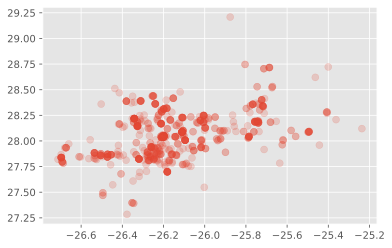

In [7]:
plt.scatter(x[:,0],x[:,1], alpha=0.2, s=50)

# Putting all the data on a map 

In [8]:
m = folium.Map(location = [df.LAT.mean(),df.LON.mean()], zoom_start=9, tiles="Stamen Toner")

In [9]:
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row.LAT,row.LON],
        radius=5,
        popup=re.sub(r'[^a-zA-Z ]+','',row.NAME),
        color='#e6194b',
        fill_color='#e6194b'
    ).add_to(m)

In [10]:
m

# Clustering metrics - show difference in silhouette score for different clusters

In [11]:
X_blobs, _ = make_blobs(n_samples=1000, centers=10, n_features=2, cluster_std=0.5, random_state=4)

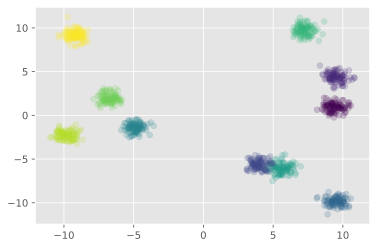

In [12]:
plt.scatter(X_blobs[:,0], X_blobs[:,1], c=_, alpha=0.2)

In [13]:
class_prediction = np.load("../data/sample_clusters.npy")

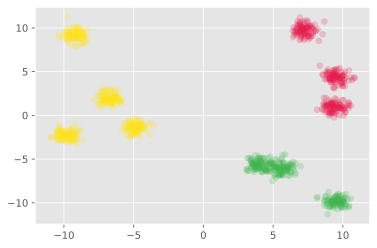

In [14]:
unique_clusters = np.unique(class_prediction)

for cluster in unique_clusters:
    X = X_blobs[class_prediction==cluster]
    plt.scatter(X[:,0], X[:,1], c=cols[cluster], alpha=0.2)

In [15]:
silhouette_score(X_blobs, class_prediction)

0.6657220862867241

In [16]:
silhouette_score(X_blobs, _)

0.7419065626314164

# Let's cluster using k-means

A sample iteractive graph to show how kmeans finds the centroid

In [17]:
X_blobs, _ = make_blobs(n_samples=1000, centers=50, n_features=2, cluster_std=1, random_state=4)

In [18]:
data = defaultdict(dict)
for x in range(1,21):
    model = KMeans(n_init=1, n_clusters=3, random_state=17, max_iter=x).fit(X_blobs)
    data[x]["class_predictions"] = model.predict(X_blobs)
    data[x]["centroids"] = model.cluster_centers_
    data[x]["unique_classes"] = np.unique(class_prediction)
    

In [19]:
def f(x):
    class_predictions = data[x]['class_predictions']
    centroids = data[x]['centroids']
    unique_classes = data[x]['unique_classes']

    for unique_class in unique_classes:
            plt.scatter(X_blobs[class_predictions==unique_class][:,0], 
                        X_blobs[class_predictions==unique_class][:,1], 
                        alpha=0.3, c=cols[unique_class])
    plt.scatter(centroids[:,0], centroids[:,1], s=200, c='#000000', marker='v')
    plt.ylim([-15,15]); plt.xlim([-15,15])
    plt.title('How K-Means Clusters')

interactive_plot = interactive(f, x=(1, 20))
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(IntSlider(value=10, description='x', max=20, min=1), Output(layout=Layout(height='350px'…

applying kmeans to our lat long data

In [20]:
x = np.array(df[["LAT","LON"]], dtype = "float64")
k= 70
model = KMeans(n_clusters=k, random_state=17, max_iter=10, n_init=1).fit(x)
class_prediction = model.predict(x)
df[f"class_predictions{k}"] = class_prediction

In [21]:
def create_map(df, cluster_column):
            
    for _, row in df.iterrows():
        
        if row[cluster_column] == -1:
            cluster_colour = '#000000'
        else:
            cluster_colour = cols[row[cluster_column]]
        
        folium.CircleMarker(
            location=[row.LAT,row.LON],
            radius=5,
            popup=row[cluster_column],
            color=cluster_colour,
            fill_color=cluster_colour,
            fill=True
        ).add_to(m)
    
    return m

m = create_map(df,"class_predictions70")
silhouette_score(x,class_prediction)
    

0.6362758441124264

In [22]:
m

In [23]:
best_silhouette, best_k = -1, 0

for k in tqdm(range(2, 100)):
    model = KMeans(n_clusters=k, random_state=1).fit(x)
    class_predictions = model.predict(x)
    
    curr_silhouette = silhouette_score(x, class_predictions)
    if curr_silhouette > best_silhouette:
        best_k = k
        best_silhouette = curr_silhouette
        
print(f'K={best_k}')
print(f'Silhouette Score: {best_silhouette}') 

100%|██████████| 98/98 [00:34<00:00,  2.85it/s]

K=98
Silhouette Score: 0.6971995093192229


# DBSCan 

In [24]:
model = DBSCAN(eps=0.01, min_samples=5).fit(x)
class_prediction = model.labels_
df["clusters_DBScan"]= class_prediction

## create map
m = create_map(df,"clusters_DBScan")

In [25]:
m

In [26]:
print(f'Number of clusters found: {len(np.unique(class_prediction))}')
print(f'Number of outliers found: {len(class_prediction[class_prediction==-1])}')

print(f'Silhouette ignoring outliers: {silhouette_score(x[class_prediction!=-1], class_prediction[class_prediction!=-1])}')

no_outliers = 0
no_outliers = np.array([(counter+2)*x if x==-1 else x for counter, x in enumerate(class_prediction)])
print(f'Silhouette outliers as singletons: {silhouette_score(x, no_outliers)}')

Number of clusters found: 51
Number of outliers found: 289
Silhouette ignoring outliers: 0.9232138256614868
Silhouette outliers as singletons: 0.5667489355530314


# HDBScan

In [27]:
model = hdbscan.HDBSCAN(min_cluster_size=5,min_samples=2, cluster_selection_epsilon=0.01)

class_prediction = model.fit_predict(x)
df["clusters_HDBScan"]= class_prediction

m = create_map(df,"clusters_HDBScan")

In [28]:
print(f'Number of clusters found: {len(np.unique(class_prediction))}')
print(f'Number of outliers found: {len(class_prediction[class_prediction==-1])}')

print(f'Silhouette ignoring outliers: {silhouette_score(x[class_prediction!=-1], class_prediction[class_prediction!=-1])}')

no_outliers = 0
no_outliers = np.array([(counter+2)*x if x==-1 else x for counter, x in enumerate(class_prediction)])
print(f'Silhouette outliers as singletons: {silhouette_score(x, no_outliers)}')

Number of clusters found: 67
Number of outliers found: 102
Silhouette ignoring outliers: 0.767050436112213
Silhouette outliers as singletons: 0.638992483653762


In [29]:
m

# Addressing the outliers from HDBScan approach

In [30]:
classifier = KNeighborsClassifier(n_neighbors=1)

In [31]:
train = x[class_prediction!=-1]
test = x[class_prediction==-1]

In [32]:
classifier.fit(train,class_prediction[class_prediction!=-1])

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')

In [33]:
predictions = classifier.predict(test)

In [34]:
df["Cluster_Hybrid"]=df["clusters_HDBScan"]
df.loc[df.Cluster_Hybrid==-1,'Cluster_Hybrid']=predictions


In [35]:
m = create_map(df,"Cluster_Hybrid")

In [36]:
m

In [37]:
silhouette_score(x,np.array(df["Cluster_Hybrid"]))

0.5849126496933005

Text(0.5, 0, 'Cluster Sizes')

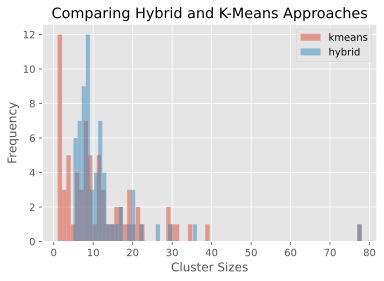

In [38]:
df.class_predictions70.value_counts().plot.hist(bins=70,alpha=0.5,label="kmeans")
df.Cluster_Hybrid.value_counts().plot.hist(bins=70,alpha=0.5,label="hybrid")
plt.legend()
plt.title('Comparing Hybrid and K-Means Approaches')
plt.xlabel('Cluster Sizes')